# Bus Classifier
## External modules needed

In [1]:
# Based on https://www.kaggle.com/l0new0lf/vehicle-classification

import os
import numpy as np
import pandas as pd
# %matplotlib inline
import matplotlib.pyplot as plt
import base64
import random
from pathlib import Path
import shutil
from collections import OrderedDict
import cv2
from PIL import Image

import keras
# For one-hot-encoding
from keras.utils import np_utils
# For creating sequenttial model
from keras.models import Sequential
from keras.layers import Conv2D,MaxPooling2D,Dense,Flatten,Dropout
# For saving and loading models
from keras.models import load_model

from keras.preprocessing.image import ImageDataGenerator
from keras.applications import ResNet50
from keras.applications.resnet50 import preprocess_input
from keras import Model, layers
from keras.models import load_model, model_from_json

## Constants declaration

In [3]:
# BASE_PATH = Path('C:/Users/jaherran/Projects/Python/BusClassifier/vehicle/train/train/')
BASE_PATH = Path('/home/jaimehmol/Projects/Python/BusClassifierWorkspace/BusClassifier/data/raw/train/')
# INPUT_WORKING_PATH = Path('C:/Users/jaherran/Projects/Python/BusClassifier/vehicle/working/data/')
INPUT_WORKING_PATH = Path('/home/jaimehmol/Projects/Python/BusClassifierWorkspace/BusClassifier/data/prepared/')
# OUTPUT_MODELS_PATH = Path('C:/Users/jaherran/Projects/Python/BusClassifier/vehicle/working/models/')
OUTPUT_MODELS_PATH = Path('/home/jaimehmol/Projects/Python/BusClassifierWorkspace/BusClassifier/model/')

## Dataset handling and exploration


In [28]:
all_classes = os.listdir(BASE_PATH)

# create dict of list of images per class
dataset = {}
for vehicle in all_classes:
    dataset[vehicle] = [i for i in os.listdir(BASE_PATH / vehicle)]

# verify
print(dataset.keys())
print(len(dataset.keys()))

dict_keys(['Motorcycle', 'Car', 'Bicycle', 'Tank', 'Van', 'Boat', 'Bus', 'Caterpillar', 'Snowmobile', 'Cart', 'Taxi', 'Helicopter', 'Segway', 'Ambulance', 'Truck', 'Limousine', 'Barge'])
17


In [29]:
# convert dict to pandas df
df = pd.DataFrame.from_dict(dataset, orient='index')
df = df.transpose()

In [30]:
df.head()

,Motorcycle,Car,Bicycle,Tank,Van,Boat,Bus,Caterpillar,Snowmobile,Cart,Taxi,Helicopter,Segway,Ambulance,Truck,Limousine,Barge
0,002403_17.jpg,002844_10.jpg,001399_02.jpg,003310_04.jpg,000211_15.jpg,000036_06.jpg,000047_01.jpg,002652_18.jpg,002649_10.jpg,000863_03.jpg,002014_02.jpg,003440_09.jpg,002438_09.jpg,000490_01.jpg,001171_19.jpg,003854_00.jpg,000300_08.jpg
1,002447_04.jpg,000338_14.jpg,002536_01.jpg,001915_02.jpg,000123_17.jpg,004802_02.jpg,000037_03.jpg,002148_02.jpg,000277_10.jpg,000982_18.jpg,000061_15.jpg,004794_05.jpg,001668_10.jpg,003451_10.jpg,000046_07.jpg,004582_10.jpg,000689_15.jpg
2,004716_00.jpg,003319_09.jpg,005417_02.jpg,000223_01.jpg,002387_10.jpg,002250_03.jpg,003803_00.jpg,000580_18.jpg,001237_05.jpg,003323_18.jpg,002604_09.jpg,004779_00.jpg,002601_09.jpg,002199_00.jpg,003076_05.jpg,004355_10.jpg,002368_05.jpg
3,000433_02.jpg,002206_10.jpg,000847_19.jpg,000664_05.jpg,002080_00.jpg,000049_10.jpg,002930_17.jpg,001579_18.jpg,003481_18.jpg,005326_05.jpg,002814_09.jpg,005079_00.jpg,001748_01.jpg,002547_03.jpg,004711_02.jpg,003001_01.jpg,000884_10.jpg
4,004890_10.jpg,000607_18.jpg,002568_01.jpg,000315_12.jpg,001215_01.jpg,000470_10.jpg,000052_16.jpg,004012_18.jpg,000119_11.jpg,003587_18.jpg,000565_15.jpg,000293_14.jpg,002550_03.jpg,000149_15.jpg,002187_10.jpg,003050_02.jpg,002659_00.jpg


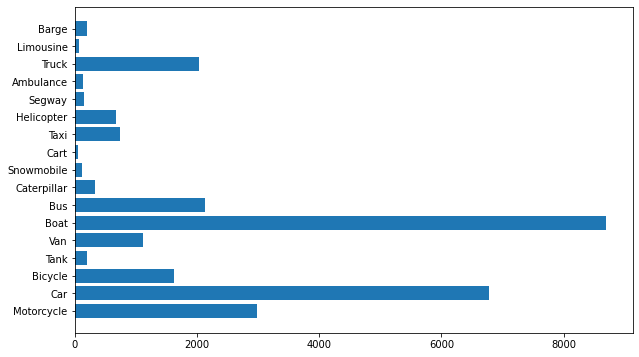

In [31]:
cols = []
col_imgs = []
for col in df.columns:
    cols.append(col)
    col_imgs.append(df[col].count())

plt.figure(figsize=(10,6))
plt.barh(cols, col_imgs)
plt.show()

Displaying 4 ranndom image per vehicle class


<Figure size 432x288 with 0 Axes>

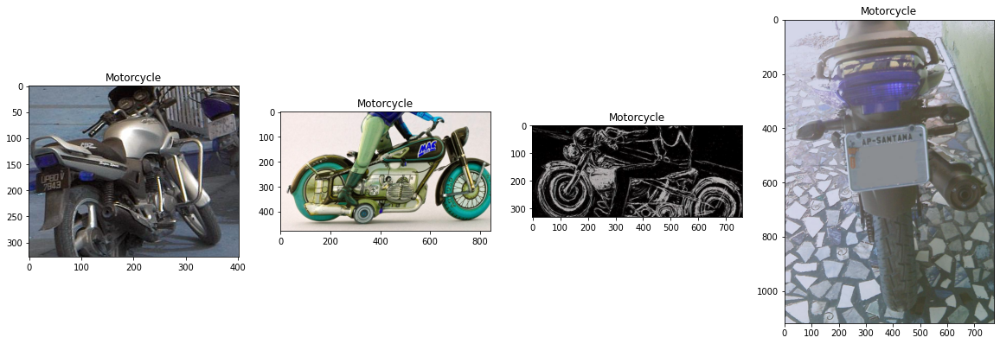

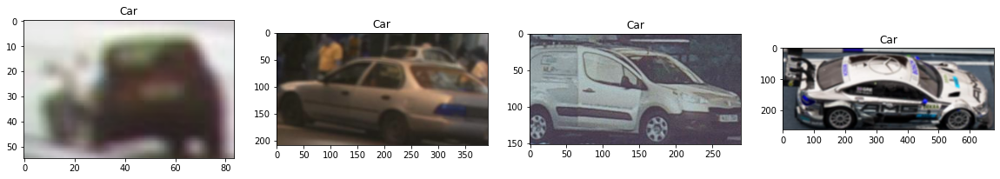

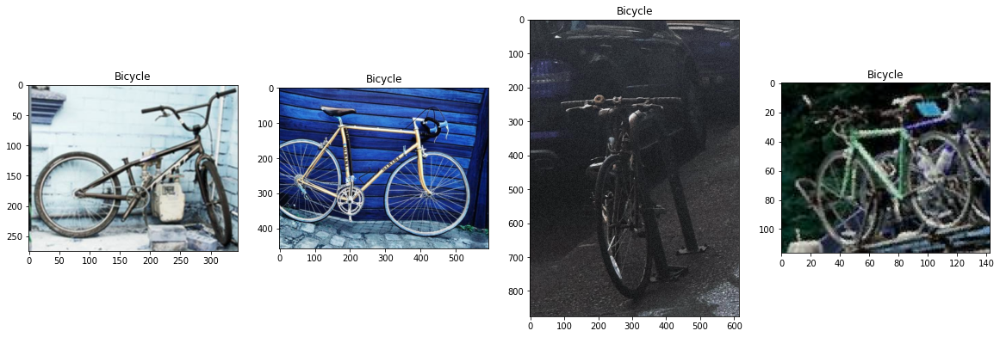

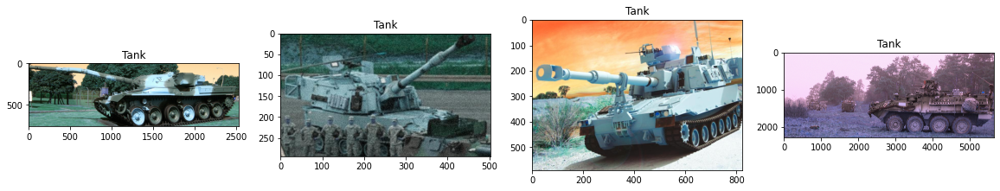

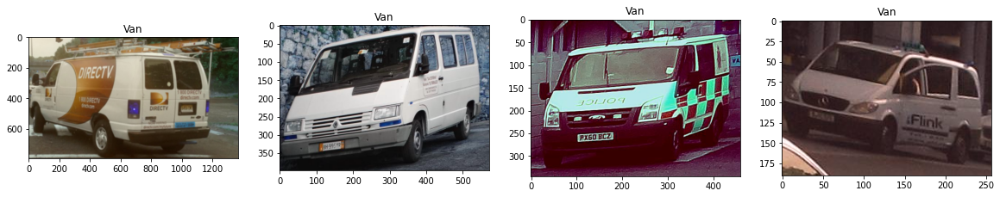

...

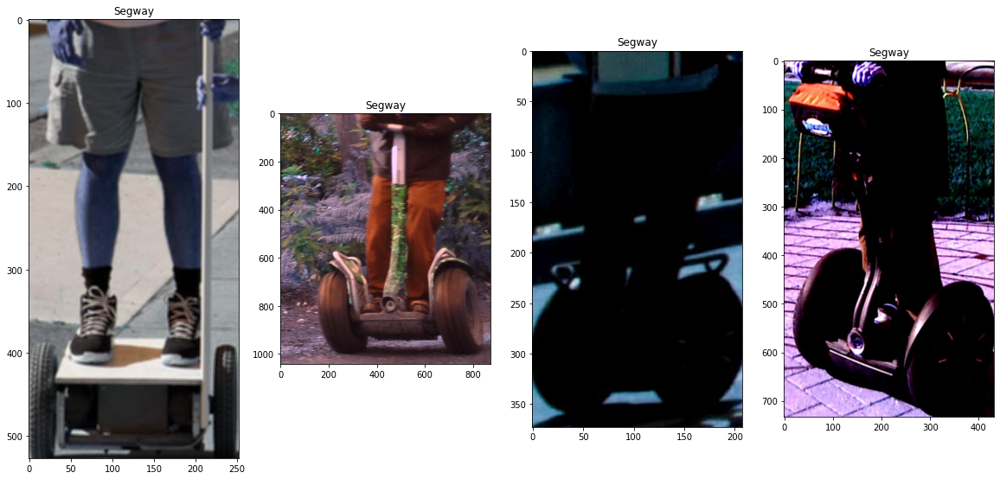

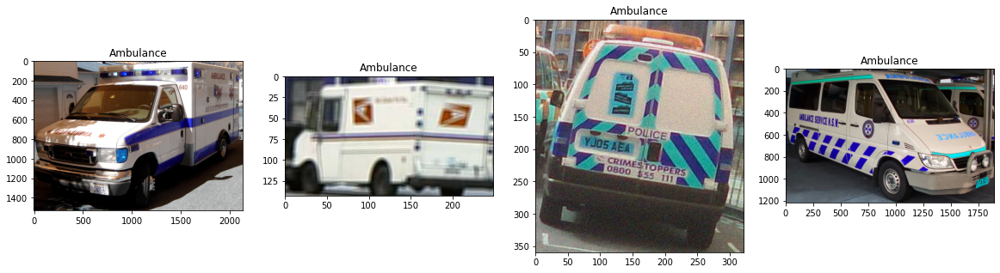

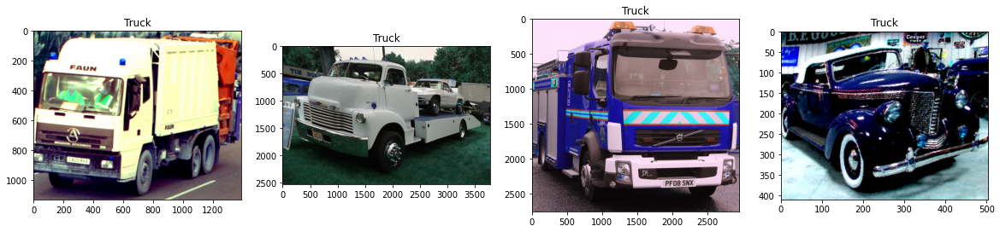

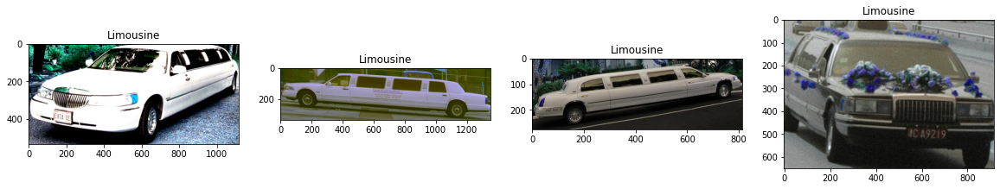

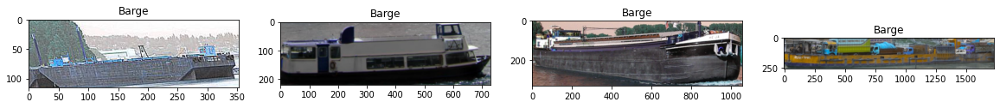

In [32]:
print("="*70)
print("Displaying 4 ranndom image per vehicle class")
print("="*70)

# for every class in 'cols'
for j in range(17):
    plt.figure(j)
    plt.figure(figsize=(20,20))
    
    # 4 images per every class
    for i in range(4):
        id = "14{}".format(i+1)
        plt.subplot(int(id))
        random_file = random.choice(os.listdir(BASE_PATH / cols[j]))
        img = cv2.imread(str(BASE_PATH / cols[j] / random_file)) # Shame on you cv2
        plt.title(cols[j])
        plt.imshow(img)
plt.show()

## PREPARING TO TRAIN - Alternative 1: Use all the images available (28045) resizing them to 224x224 pixels and predicting all 17 classes

In [33]:
# # Slow and memory expensive!!!!

# data = []
# labels = []
# cols = sorted(cols)

# # Creating trainable 224x224 images
# #                    -------
# for vehicle_class in cols:
#     print(vehicle_class + " started .....")
#     for filename in df[vehicle_class]:
#         try:
#             # for empty cols
#             if filename == None:
#                 pass
#             else:   
#                 image = cv2.imread(str(BASE_PATH / vehicle_class / filename))
#                 image_from_numpy_array = Image.fromarray(image, "RGB")
#                 resized_image = image_from_numpy_array.resize((224, 224))
#                 data.append(np.array(resized_image))

#                 if vehicle_class == 'Ambulance':
#                     labels.append(0)
#                 elif vehicle_class == 'Barge':
#                     labels.append(1)
#                 elif vehicle_class == 'Bicycle':
#                     labels.append(2)
#                 elif vehicle_class == 'Boat':
#                     labels.append(3)
#                 elif vehicle_class == 'Bus':
#                     labels.append(4)
#                 elif vehicle_class == 'Car':
#                     labels.append(5)
#                 elif vehicle_class == 'Cart':
#                     labels.append(6)
#                 elif vehicle_class == 'Caterpillar':
#                     labels.append(7)
#                 elif vehicle_class == 'Helicopter':
#                     labels.append(8)
#                 elif vehicle_class == 'Limousine':
#                     labels.append(9)
#                 elif vehicle_class == 'Motorcycle':
#                     labels.append(10)
#                 elif vehicle_class == 'Segway':
#                     labels.append(11)
#                 elif vehicle_class == 'Snowmobile':
#                     labels.append(12)
#                 elif vehicle_class == 'Tank':
#                     labels.append(13)
#                 elif vehicle_class == 'Taxi':
#                     labels.append(14)
#                 elif vehicle_class == 'Truck':
#                     labels.append(15)
#                 elif vehicle_class == 'Van':
#                     labels.append(16)
#                 else:
#                     print("Something is wrong.")
                
#         except AttributeError:
#             print("Attribute error occured for " + filename)


# vehicle_images_224x224 = np.array(data)
# labels_224x224 = np.array(labels)

# # save the numpy arrays in files (.npy) to be used afterward
# np.save("all-vehicle-224x224-images-as-arrays", vehicle_images_224x224)
# np.save("corresponding-labels-for-all-224x224-images", labels_224x224)

# # Wherever you need the numpy arrays use:
# # data = np.load("all-vehicle-224x224-images-as-arrays.npy")
# # labels = np.load("corresponding-labels-for-all-224x224-images.npy")


# print(" ")
# print(f"Shape of the output numpy array: {vehicle_images_224x224.shape}")
# print(f"Number of images available to train: {labels_224x224.shape}")
# print(f"The distinct labels (all_classes): {np.unique(labels_224x224)}")

# # Output:
# # Shape of the output numpy array: (28045, 224, 224, 3)
# # Number of images available to train: (28045,)
# # The distinct labels (all_classes): [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16]

Ambulance started .....
Barge started .....
Bicycle started .....
Boat started .....
Bus started .....
Car started .....
Cart started .....
Caterpillar started .....
Helicopter started .....
Limousine started .....
Motorcycle started .....
Segway started .....
Snowmobile started .....
Tank started .....
Taxi started .....
Truck started .....
Van started .....
 
Shape of the output numpy array: (28045, 224, 224, 3)
Number of images available to train: (28045,)
The distinct labels (all_classes): [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16]


## PREPARING TO TRAIN - Alternative 2: Reducing classes to predict to 7 and the amount of images to train (up to 1200) and test (up to 300)

In [34]:
# Classes to be considered on the training of the model (From the 17 available on the raw input dataset)
reduced_classes = ['Bicycle', 'Boat', 'Bus', 'Car', 'Motorcycle', 'Truck', 'Van']

for dir in ["test", "train"]:
    for _class in reduced_classes:
        os.makedirs(INPUT_WORKING_PATH / dir / _class, exist_ok=True)

for _class in reduced_classes:
    images = os.listdir(BASE_PATH / _class)

    test = images[:300]

    # downsample to max 1500 images (300 for test and 1200 for train).
    if len(images) < 1500:
      train = images[300:]
    else:
      train = images[300:1500]

    # move images to test-set folder
    for image in test:
        shutil.copy(BASE_PATH / _class / image, INPUT_WORKING_PATH / 'test' / _class / image)

    # move images to train-set folder
    for image in train:
        shutil.copy(BASE_PATH / _class / image, INPUT_WORKING_PATH / 'train' / _class / image)



# Image classification
It will return the category to which an image belongs. Specifically one array with the probabilities of the input image to belong to each of the categories in which the model was trained.

## Creating training and validation generators applying some image pre-processing

In [35]:
train_datagen = ImageDataGenerator(
    shear_range=10,
    zoom_range=0.2,
    horizontal_flip=True,
    preprocessing_function=preprocess_input)

train_generator = train_datagen.flow_from_directory(
    INPUT_WORKING_PATH / 'train',
    batch_size=32,
    #class_mode='binary',
    target_size=(224,224))

validation_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input)

validation_generator = validation_datagen.flow_from_directory(
    INPUT_WORKING_PATH / 'test',
    shuffle=False,
    #class_mode='binary',
    target_size=(224,224))

Found 8011 images belonging to 7 classes.
Found 2100 images belonging to 7 classes.


## Transfer learning
Using an existing pre-trained model (called application in Keras). In this case is ResNet50, that has showed great results on image classfication problems.

In [36]:
conv_base = ResNet50(
    include_top=False,
    weights='imagenet')

for layer in conv_base.layers:
    layer.trainable = False

conv_base.summary()

4_3_bn[0][0]          
__________________________________________________________________________________________________
conv3_block4_out (Activation)   (None, None, None, 5 0           conv3_block4_add[0][0]           
__________________________________________________________________________________________________
conv4_block1_1_conv (Conv2D)    (None, None, None, 2 131328      conv3_block4_out[0][0]           
__________________________________________________________________________________________________
conv4_block1_1_bn (BatchNormali (None, None, None, 2 1024        conv4_block1_1_conv[0][0]        
__________________________________________________________________________________________________
conv4_block1_1_relu (Activation (None, None, None, 2 0           conv4_block1_1_bn[0][0]          
__________________________________________________________________________________________________
conv4_block1_2_conv (Conv2D)    (None, None, None, 2 590080      conv4_block1_1_relu[0

In [37]:

# This is our custom network architecture! 
# Testing multiple configurations can improve accuracy 
# (always check accuracy and loss in the validation (test) set!!)
x = conv_base.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(512, activation='relu')(x)
predictions = layers.Dense(7, activation='softmax')(x)

model = Model(conv_base.input, predictions)
optimizer = keras.optimizers.Adam()

model.summary()


# # Example for a different network architecture:
# x = conv_base.output
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(128, activation='relu')(x) 
# predictions = layers.Dense(7, activation='softmax')(x)

# model = Model(conv_base.input, predictions)
# optimizer = keras.optimizers.Adam(learning_rate=0.000001)

][0]          
__________________________________________________________________________________________________
conv4_block1_2_conv (Conv2D)    (None, None, None, 2 590080      conv4_block1_1_relu[0][0]        
__________________________________________________________________________________________________
conv4_block1_2_bn (BatchNormali (None, None, None, 2 1024        conv4_block1_2_conv[0][0]        
__________________________________________________________________________________________________
conv4_block1_2_relu (Activation (None, None, None, 2 0           conv4_block1_2_bn[0][0]          
__________________________________________________________________________________________________
conv4_block1_0_conv (Conv2D)    (None, None, None, 1 525312      conv3_block4_out[0][0]           
__________________________________________________________________________________________________
conv4_block1_3_conv (Conv2D)    (None, None, None, 1 263168      conv4_block1_2_relu[0][0]    

In [39]:
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])

history = model.fit_generator(generator=train_generator,
                              steps_per_epoch=347 // 32,  # added in Kaggle
                              epochs=30,
                              validation_data=validation_generator,
                              validation_steps=10  # added in Kaggle
                             )

Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/30
10/10 [==============================] - 275s 27s/step - loss: 2.5450 - accuracy: 0.4125 - val_loss: 1.9922 - val_accuracy: 0.4344
Epoch 2/30
10/10 [==============================] - 715s 71s/step - loss: 0.9373 - accuracy: 0.6500 - val_loss: 0.6607 - val_accuracy: 0.7344
Epoch 3/30
10/10 [==============================] - 437s 44s/step - loss: 0.5683 - accuracy: 0.8344 - val_loss: 0.9165 - val_accuracy: 0.7094
Epoch 4/30
10/10 [==============================] - 357s 36s/step - loss: 0.5883 - accuracy: 0.8094 - val_loss: 0.6196 - val_accuracy: 0.7563
Epoch 5/30
10/10 [==============================] - 257s 26s/step - loss: 0.5481 - accuracy: 0.8031 - val_loss: 0.1424 - val_accuracy: 0.9563
Epoch 6/30
10/10 [==============================] - 584s 58s/step - loss: 0.4847 - accuracy: 0.8250 - val_loss: 0.2179 - val_accuracy: 0.9156
Epoch 7/30
10/10 [==============================] - 356s 36s/step - loss

## Saving the model and converting it into different formats

In [40]:
model.save(OUTPUT_MODELS_PATH / 'busModel.h5')
model.save_weights(OUTPUT_MODELS_PATH / 'busModelWeights.h5')

# Serialize model to json
model_json = model.to_json()
with open(OUTPUT_MODELS_PATH / 'busModel.json', 'w') as json_file:
    json_file.write(model_json)
    

# Convert keras model to tensorflow js model using the comand line     
# In a new isolated environment install tensorflowjs:
# pip install tensorflowjs
# Then run the following in a terminal:
# tensorflowjs_converter --input_format=keras --weight_shard_size_bytes=105000000 /home/jaimehmol/Projects/Python/BusClassifierWorkspace/BusClassifier/model/busModel.h5 /home/jaimehmol/Projects/Python/BusClassifierWorkspace/BusClassifier/model/tensorflowjs/ 
# --weight_shard_size_bytes is used to ensure the converted model is all in just one file

# Convert keras model to tensorflow js model using the Python API  
# HINT: Not used, at the end I used the Tensor Flow JS command line utility to do this
# import tensorflowjs as tfjs
# tfjs.converters.save_keras_model(model, "C://Users//jaherran//Projects//Python//BusClassifier//vehicle//working//models2//")

## Evaluating the model

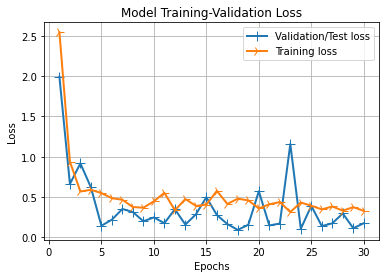

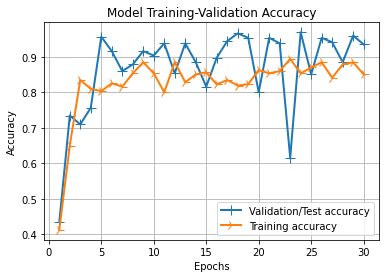

In [41]:
history_dict = history.history

# plot loss chart
loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
epochs = range(1, len(loss_values) + 1)

line1 = plt.plot(epochs, val_loss_values, label='Validation/Test loss')
line2 = plt.plot(epochs, loss_values, label='Training loss')
plt.setp(line1, linewidth=2.0, marker = '+', markersize=10.0)
plt.setp(line2, linewidth=2.0, marker = '4', markersize=10.0)
plt.xlabel('Epochs') 
plt.ylabel('Loss')
plt.title('Model Training-Validation Loss')
plt.grid(True)
plt.legend()
plt.show()


# plot accuracy chart
accuracy_values = history_dict['accuracy']
val_accuracy_values = history_dict['val_accuracy']
epochs = range(1, len(accuracy_values) + 1)

line1 = plt.plot(epochs, val_accuracy_values, label='Validation/Test accuracy')
line2 = plt.plot(epochs, accuracy_values, label='Training accuracy')
plt.setp(line1, linewidth=2.0, marker = '+', markersize=10.0)
plt.setp(line2, linewidth=2.0, marker = '4', markersize=10.0)
plt.xlabel('Epochs') 
plt.ylabel('Accuracy')
plt.title('Model Training-Validation Accuracy')
plt.grid(True)
plt.legend()
plt.show()

## Predicting using one validation input (No train, no test input)

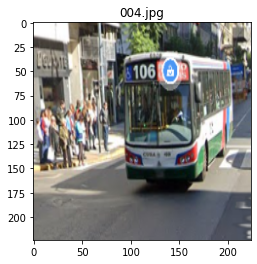

Prediction:
[{'Bicycle': '0.16%'}, {'Boat': '0.35%'}, {'Bus': '53.45%'}, {'Car': '10.43%'}, {'Motorcycle': '0.14%'}, {'Truck': '0.66%'}, {'Van': '34.80%'}]


In [12]:
# Loading the model from an existing file:
# model = load_model(OUTPUT_MODELS_PATH / 'busModel.h5')
# optimizer = keras.optimizers.Adam()
# model.compile(loss='categorical_crossentropy',
#               optimizer=optimizer,
#               metrics=['accuracy'])
reduced_classes = ['Bicycle', 'Boat', 'Bus', 'Car', 'Motorcycle', 'Truck', 'Van']

def readb64(base64_string):
    nparr = np.frombuffer(base64.b64decode(base64_string), np.uint8)
    img = cv2.imdecode(nparr, cv2.IMREAD_COLOR)
    return img



file_to_predict = INPUT_WORKING_PATH / 'validation' / '004.jpg'

# Load and encode the image to predict
with open(file_to_predict, "rb") as img:
    encoded_string = base64.b64encode(img.read())
# print(encoded_string)
    
# img = cv2.imread(str(file_to_predict))
img = readb64(encoded_string)
img_resized = cv2.resize(img, (224,224))
img_np = np.reshape(img_resized, [1, 224, 224, 3])
# print(img_np) 

# HINT: This won't run if you are running either in a "remote" system or 
# one without window manager (qt will fail creating the window to show the image) 
# cv2.imshow('First image', img)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

RGB_img = cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB)
plt.imshow(RGB_img)
plt.title(file_to_predict.name)
plt.show()

predict = model.predict(img_np)
formated_predict = ["{:.2f}%".format(round(float(prediction*100), 2)) for prediction in predict[0]]
output_prediction = [{class_name: value} for class_name, value in zip(reduced_classes, formated_predict)]

print("="*70)
print("Prediction:")
print("="*70)
print(output_prediction)

# Object (Bus) detection
It will detect not only the category present in an image but the location of that category (object) too.